In [ ]:
# Logistic Regression implementation using differnt solvers

In [3]:
# Library import
import pandas as pd 
import numpy as np 
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import pickle
import pandas.util.testing as tm

In [4]:
# Data import
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [5]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [6]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Variance inflation factor learn this
# if data set is skewed then go for mean for replacement not median

Handling missing values by replacing with average

In [9]:
df['BMI'] = df['BMI'].replace(0, df['BMI'].mean())

In [10]:
df['Glucose']= df['Glucose'].replace(0, df['Glucose'].mean())

In [11]:
df['Insulin']= df['Insulin'].replace(0, df['Insulin'].mean())

In [12]:
df['BloodPressure']= df['BloodPressure'].replace(0, df['BloodPressure'].mean())

In [13]:
df['SkinThickness']= df['SkinThickness'].replace(0, df['SkinThickness'].mean())

In [14]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [ ]:
ProfileReport(df)

<AxesSubplot:>

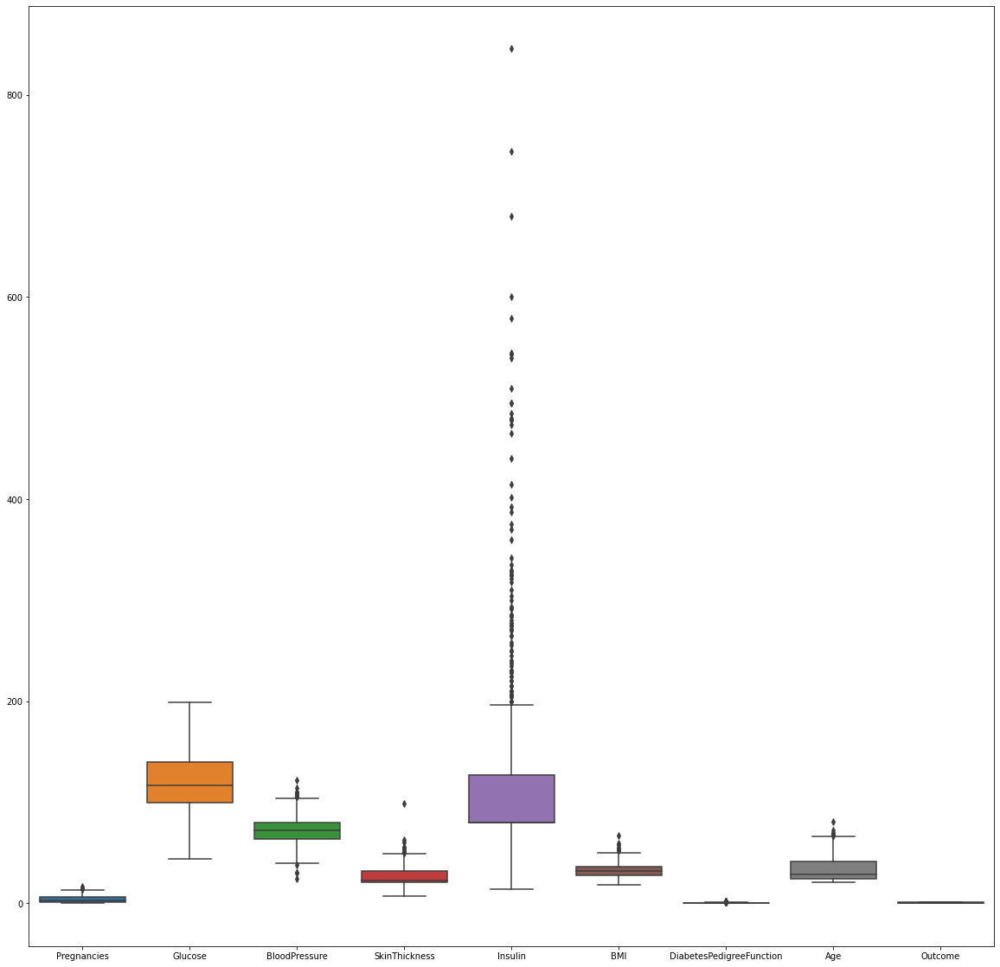

In [15]:
# to find outlier
fig,ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df, ax= ax)

In [21]:
# outliers handling

q = df['Pregnancies'].quantile(.98)
df_new = df[df['Pregnancies'] < q]

q = df_new['BMI'].quantile(.99)
df_new = df_new[df_new['BMI'] < q]

q = df_new['SkinThickness'].quantile(.99)
df_new = df_new[df_new['SkinThickness'] < q]

q = df_new['Insulin'].quantile(.95)
df_new = df_new[df_new['Insulin'] < q]

q = df_new['DiabetesPedigreeFunction'].quantile(.98)
df_new = df_new[df_new['DiabetesPedigreeFunction'] < q]

q = df_new['Age'].quantile(.99)
df_new = df_new[df_new['Age'] < q]


In [22]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

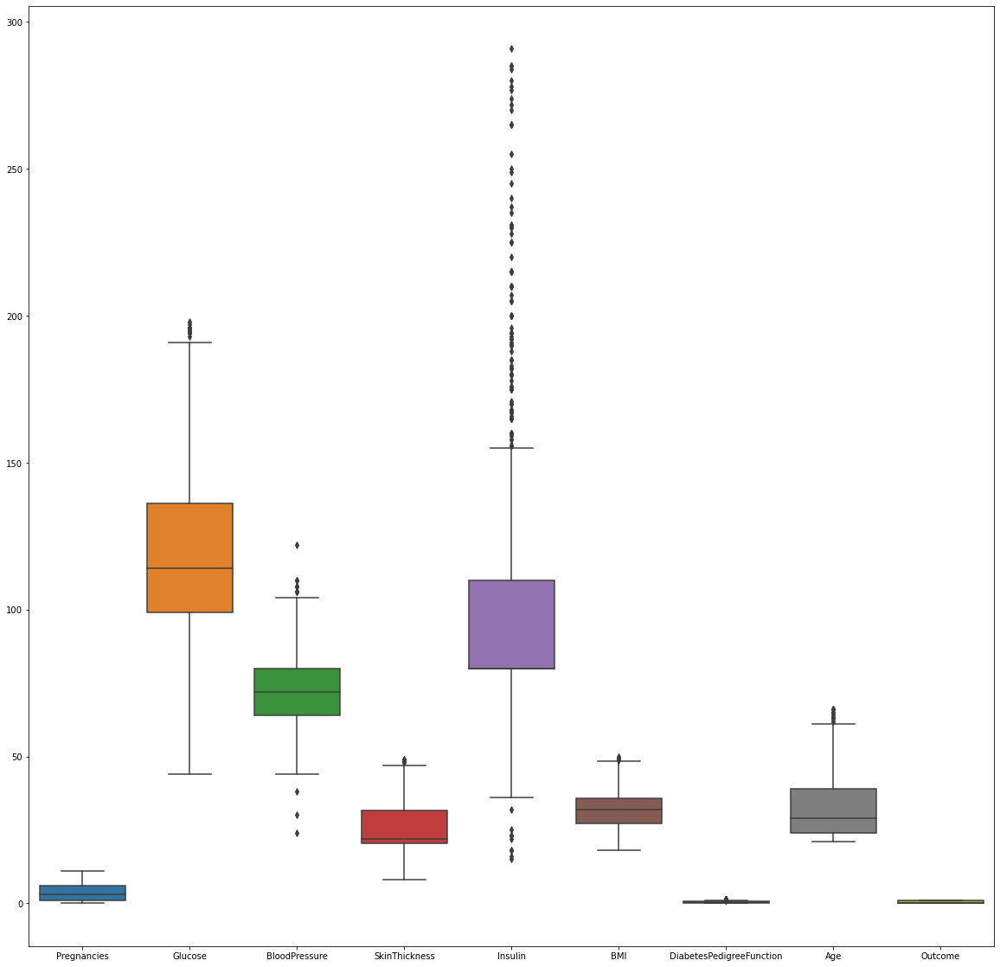

In [24]:
fig,ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new, ax= ax)

In [25]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
y = df_new['Outcome']
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 667, dtype: int64

In [27]:
X = df_new.drop(columns = ['Outcome'])

In [28]:
X

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [29]:
scalar = StandardScaler()
ProfileReport(pd.DataFrame(scalar.fit_transform(X))) 
X_scaled = scalar.fit_transform(X)

<AxesSubplot:>

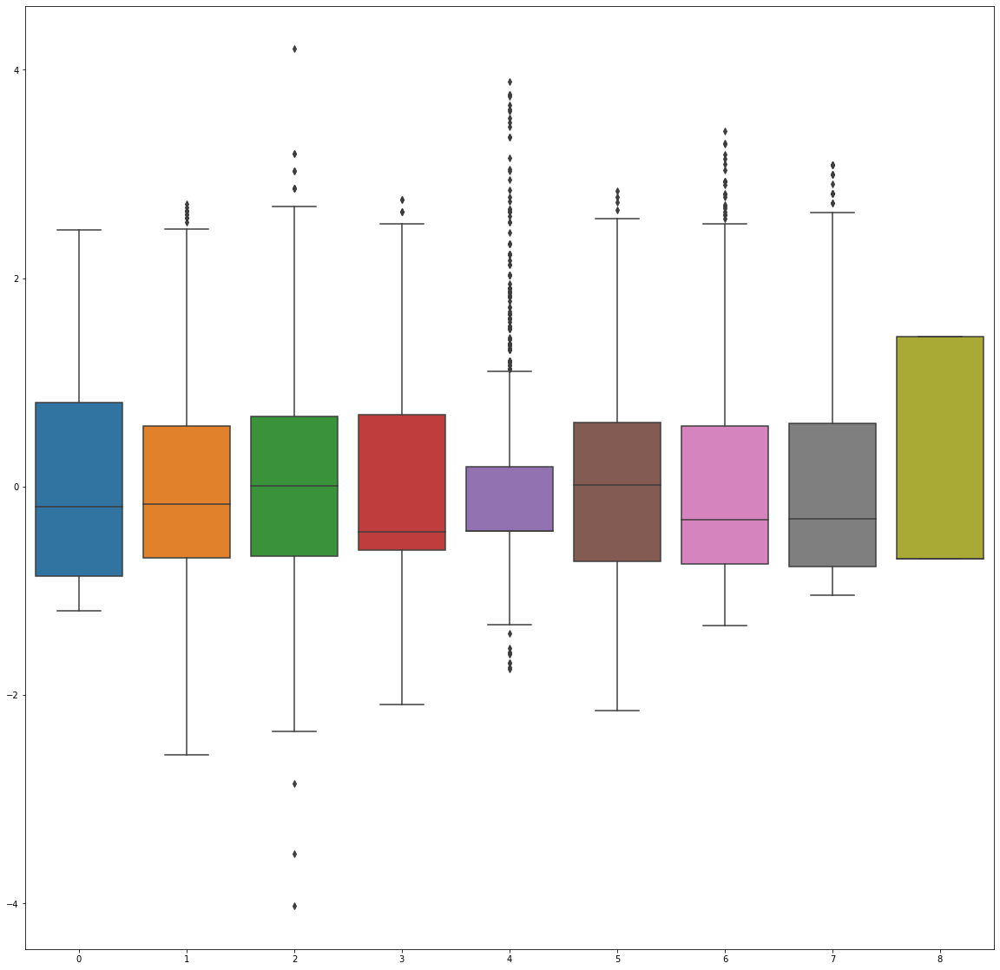

In [31]:

df_new_scalar = pd.DataFrame(scalar.fit_transform(df_new))

fig,ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new_scalar, ax = ax)

In [32]:
X_scaled

array([[ 0.80130554,  0.99618532,  0.00322719, ...,  0.26808854,
         0.70782247,  1.61773112],
       [-0.86371252, -1.167435  , -0.50078176, ..., -0.8301233 ,
        -0.32098354, -0.12544603],
       [ 1.46731277,  2.1981966 , -0.66878474, ..., -1.34785174,
         0.87556258, -0.03369987],
       ...,
       [ 0.46830193,  0.06891947,  0.00322719, ..., -0.89287827,
        -0.71610469, -0.2171922 ],
       [-0.86371252,  0.24063537, -1.0047907 , ..., -0.28101738,
        -0.32843866,  1.34249262],
       [-0.86371252, -0.89268956, -0.16477579, ..., -0.23395116,
        -0.45517563, -0.85941536]])

In [33]:
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 667, dtype: int64

In [34]:
#vif_score

def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])

In [35]:
vif_score(X)

,FEATURE,VIF_SCORE
0,Pregnancies,1.438733
1,Glucose,1.313581
2,BloodPressure,1.257822
3,SkinThickness,1.466461
4,Insulin,1.282201
5,BMI,1.506556
6,DiabetesPedigreeFunction,1.039277
7,Age,1.655732


In [36]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled, y, test_size = .20, random_state = 144)

In [37]:
x_train

array([[ 0.46830193, -1.167435  ,  0.17123018, ..., -0.45359353,
         2.93317461, -0.03369987],
       [-0.86371252,  0.06891947,  0.50723614, ...,  1.11528053,
        -0.65646376, -0.40068453],
       [-0.86371252, -0.8240032 ,  0.84324211, ...,  0.48773091,
        -0.76083539,  0.97550796],
       ...,
       [-0.5307089 , -0.9957191 ,  0.67523913, ..., -1.1752756 ,
        -0.70119446, -0.76766919],
       [-0.19770529,  1.51133301, -0.16477579, ..., -0.04568627,
        -0.63037086, -0.40068453],
       [-0.5307089 , -0.85834638, -0.33277877, ..., -0.92425575,
         0.46180364, -1.04290769]])

In [38]:
x_test

array([[ 0.46830193,  2.33556932,  0.33923316, ...,  1.8369626 ,
         2.22493859,  1.89296961],
       [ 2.13331999, -0.85834638,  0.00322719, ..., -1.37922923,
         0.58854062,  2.16820811],
       [ 1.80031638, -0.58360094,  0.33923316, ...,  0.15826736,
         0.84946968,  1.25074645],
       ...,
       [-0.5307089 , -1.23612136, -0.58478325, ...,  0.77012824,
         0.71527759, -0.76766919],
       [ 0.13529832, -0.17148279, -0.66878474, ..., -0.46928227,
        -1.1596841 , -0.76766919],
       [ 0.46830193,  0.6870967 , -0.66878474, ..., -0.51634849,
        -0.09733006, -0.58417686]])

In [39]:
x_test[0]

array([0.46830193, 2.33556932, 0.33923316, 0.15541964, 2.16889534,
       1.8369626 , 2.22493859, 1.89296961])

In [40]:
logr_liblinear = LogisticRegression(verbose =1, solver = 'liblinear')

In [46]:
# Using solver liblinear

logr_liblinear.fit(x_train,y_train)
print(logr_liblinear.predict([x_test[0]]))
print(logr_liblinear.predict_proba([x_test[0]]))
print(logr_liblinear.predict_log_proba([x_test[0]]))
print(y_test.iloc[0])

[LibLinear][1]
[[0.00824341 0.99175659]]
[[-4.79834149 -0.00827757]]
1


In [48]:
# Using default solver lbgf
logr = LogisticRegression(verbose =1)
logr.fit(x_train,y_train)
print(logr.predict([x_test[0]]))
print(logr.predict_proba([x_test[0]]))
print(logr.predict_log_proba([x_test[0]]))
print(y_test.iloc[0])

[1]
[[0.00815289 0.99184711]]
[[-4.80938297 -0.00818631]]
1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


In [52]:
y_pred_liblinear = logr_liblinear.predict(x_test)
y_pred_liblinear

array([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0])

In [55]:
y_pred_defaultsolver = logr.predict(x_test)
y_pred_defaultsolver

array([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0])

In [65]:
confusion_matrix(y_test,y_pred_liblinear)

array([[70, 13],
       [27, 24]])

In [66]:
confusion_matrix(y_test,y_pred_defaultsolver)


array([[70, 13],
       [27, 24]])

In [71]:
def model_eval(y_true, y_pred):
    tn,fp,fn,tp = confusion_matrix(y_test,y_pred).ravel()
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    specificity = tn/(fp+tn)
    f1_score = 2*(recall * precision)/(recall + precision)
    result = {"Accuracy": accuracy, "Recall": recall, "Specificity": specificity, "Fi_score": f1_score}
    return result


In [70]:
model_eval(y_test,y_pred_liblinear)

{'Accuracy': 0.7014925373134329,
 'Recall': 0.47058823529411764,
 'Specificity': 0.8433734939759037,
 'Fi_score': 0.5454545454545454}

In [72]:
model_eval(y_test,y_pred_defaultsolver)

{'Accuracy': 0.7014925373134329,
 'Recall': 0.47058823529411764,
 'Specificity': 0.8433734939759037,
 'Fi_score': 0.5454545454545454}

In [74]:
auc = roc_auc_score(y_test,y_pred_liblinear)

In [75]:
roc_auc_score(y_test,y_pred_liblinear)

0.6569808646350107

In [76]:
roc_auc_score(y_test,y_pred_defaultsolver)

0.6569808646350107

In [77]:
fpr, tpr, thresholds = roc_curve(y_test,y_pred_liblinear)

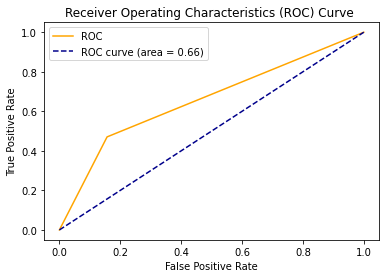

In [82]:
plt.plot(fpr, tpr, color = 'orange', label = 'ROC')
plt.plot([0,1], [0,1], color = 'darkblue', linestyle = '--', label = 'ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristics (ROC) Curve ')
plt.legend()
plt.show()